# Synthetic T1 Diffusion Training

Train the latent diffusion UNet using a pretrained autoencoder.

In [ ]:
# Install once in the CURRENT notebook kernel, then restart kernel and run all.
# In Jupyter/VS Code, prefer %pip (not !pip).
%pip install monai monai-generative nibabel scikit-image tqdm matplotlib torchmetrics torch-fidelity lpips

from importlib import util as importlib_util
import os
import re
import copy
import random
from pathlib import Path

required_modules = ["nibabel", "skimage", "monai", "generative"]
missing = [m for m in required_modules if importlib_util.find_spec(m) is None]
if missing:
    raise ModuleNotFoundError(
        f"Missing modules: {missing}. Run the %pip install cell above and restart kernel."
    )

import numpy as np
import nibabel as nib
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.amp.grad_scaler import GradScaler
from torch.amp.autocast_mode import autocast
from torch.optim.lr_scheduler import CosineAnnealingLR

from tqdm.auto import tqdm
from monai.data.dataset import Dataset
from monai.utils.misc import set_determinism

from generative.networks.nets import AutoencoderKL, DiffusionModelUNet
from generative.networks.schedulers import DDPMScheduler
from monai.transforms.utility.dictionary import EnsureChannelFirstd
from monai.transforms.spatial.dictionary import Resized
from monai.transforms.compose import Compose
from monai.transforms.io.dictionary import LoadImaged
from monai.transforms.utility.dictionary import EnsureTyped
from monai.transforms.spatial.dictionary import Orientationd, Spacingd, RandFlipd, RandRotate90d, RandAffined
from monai.transforms.intensity.dictionary import ScaleIntensityRangePercentilesd

print("All required packages imported successfully.")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 51.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.2/176.2 kB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 72.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.6/85.6 kB 11.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 5.6 MB/s eta 0:00:00


<frozen importlib._bootstrap_external>:1301: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.


All required packages imported successfully.


/usr/local/lib/python3.12/dist-packages/generative/networks/layers/vector_quantizer.py:86: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  @torch.cuda.amp.autocast(enabled=False)
/usr/local/lib/python3.12/dist-packages/generative/networks/layers/vector_quantizer.py:124: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  @torch.cuda.amp.autocast(enabled=False)


In [ ]:
# =========================
# Config
# =========================
DATASET_ROOT_OVERRIDE = None
DRIVE_FILE_LINK = "https://drive.google.com/file/d/1Ox7sCEqtM7gOM8Y72H1bqHULtWolfTu3/view?usp=sharing"

DOWNLOAD_ROOT = Path("/content/dataset_download")
EXTRACT_ROOT = Path("/content/extracted_datasets")

AUTO_DOWNLOAD = True
AUTO_EXTRACT = True

MOUNT_MYDRIVE_FOR_OUTPUTS = True
FORCE_REMOUNT_MYDRIVE = False

import tarfile
import zipfile

IS_COLAB = (
    "COLAB_GPU" in os.environ
    or "COLAB_RELEASE_TAG" in os.environ
    or Path.cwd().as_posix().startswith("/content")
)

if IS_COLAB and MOUNT_MYDRIVE_FOR_OUTPUTS:
    try:
        import importlib
        import subprocess
        import sys
        drive = importlib.import_module("google.colab.drive")
        need_mount = FORCE_REMOUNT_MYDRIVE or (not Path("/content/drive/MyDrive").exists())
        if need_mount:
            print("Mounting Google Drive at /content/drive ...")
            drive.mount("/content/drive", force_remount=FORCE_REMOUNT_MYDRIVE)
        else:
            print("Google Drive already mounted at /content/drive.")
    except Exception as e:
        print(f"Drive mount step skipped or failed: {e}")

def _find_dir_recursively(root: Path, dir_name: str):
    if not root.exists() or not root.is_dir():
        return None
    for p in root.rglob("*"):
        if p.is_dir() and p.name.lower() == dir_name.lower():
            return p
    return None

def _find_any_nifti_parent(root: Path):
    if not root.exists() or not root.is_dir():
        return None
    nii_files = list(root.rglob("*.nii")) + list(root.rglob("*.nii.gz"))
    if not nii_files:
        return None
    return nii_files[0].parent.resolve()

def _pick_downloaded_archive(download_root: Path):
    candidates = []
    for p in download_root.rglob("*"):
        if not p.is_file():
            continue
        name = p.name.lower()
        if name.endswith(".zip") or name.endswith(".tar") or name.endswith(".tar.gz") or name.endswith(".tgz") or name.endswith(".tar.bz2") or name.endswith(".tbz2") or name.endswith(".tar.xz") or name.endswith(".txz"):
            candidates.append(p)
    if not candidates:
        return None
    candidates = sorted(candidates, key=lambda p: p.stat().st_mtime, reverse=True)
    return candidates[0]

def _extract_archive(archive_path: Path, extract_root: Path):
    if not AUTO_EXTRACT:
        raise FileNotFoundError(f"Auto extract disabled, but need extraction for: {archive_path}")
    extract_root.mkdir(parents=True, exist_ok=True)
    name = archive_path.name.lower()
    print(f"Extracting archive: {archive_path}")
    if name.endswith(".zip"):
        with zipfile.ZipFile(archive_path, "r") as zf:
            zf.extractall(extract_root)
        return
    if (
        name.endswith(".tar")
        or name.endswith(".tar.gz")
        or name.endswith(".tgz")
        or name.endswith(".tar.bz2")
        or name.endswith(".tbz2")
        or name.endswith(".tar.xz")
        or name.endswith(".txz")
    ):
        with tarfile.open(archive_path, "r:*") as tf:
            tf.extractall(extract_root)
        return

    raise ValueError(f"Unsupported archive format: {archive_path}")

def _discover_dataset_root() -> Path:
    if DATASET_ROOT_OVERRIDE is not None:
        override = Path(DATASET_ROOT_OVERRIDE).expanduser()
        if not override.exists():
            raise FileNotFoundError(f"DATASET_ROOT_OVERRIDE does not exist: {override}")
        return override.resolve()
    DOWNLOAD_ROOT.mkdir(parents=True, exist_ok=True)
    EXTRACT_ROOT.mkdir(parents=True, exist_ok=True)
    if AUTO_DOWNLOAD:
        print("Installing gdown...")
        subprocess.run([sys.executable, "-m", "pip", "install", "-q", "gdown"], check=True)
        print("Downloading dataset archive with gdown from shared link...")
        print(f"Download target: {DOWNLOAD_ROOT} (runtime disk)")
        subprocess.run([sys.executable, "-m", "gdown", "--fuzzy", DRIVE_FILE_LINK, "-O", f"{DOWNLOAD_ROOT}/"], check=True)
    archive_path = _pick_downloaded_archive(DOWNLOAD_ROOT)
    if archive_path is not None:
        _extract_archive(archive_path, EXTRACT_ROOT)
    else:
        print("No archive file detected in download root; trying direct-folder/direct-file discovery.")
    final_clean = _find_dir_recursively(EXTRACT_ROOT, "final-clean-data")
    if final_clean is not None:
        return final_clean.resolve()
    t1_dir = _find_dir_recursively(EXTRACT_ROOT, "T1")
    if t1_dir is not None and t1_dir.parent.exists():
        return t1_dir.parent.resolve()
    nii_parent = _find_any_nifti_parent(EXTRACT_ROOT)
    if nii_parent is not None:
        return nii_parent
    t1_dir = _find_dir_recursively(DOWNLOAD_ROOT, "T1")
    if t1_dir is not None and t1_dir.parent.exists():
        return t1_dir.parent.resolve()
    nii_parent = _find_any_nifti_parent(DOWNLOAD_ROOT)
    if nii_parent is not None:
        return nii_parent
    raise FileNotFoundError(
        "Could not find dataset root after gdown download/extract. "
        "Expected a folder containing T1 and/or .nii/.nii.gz files."
    )

DATASET_ROOT = _discover_dataset_root()
T1_ROOT = _find_dir_recursively(DATASET_ROOT, "T1")
if T1_ROOT is None:
    has_nii_here = any(DATASET_ROOT.glob("*.nii")) or any(DATASET_ROOT.glob("*.nii.gz"))
    if has_nii_here:
        T1_ROOT = DATASET_ROOT
    else:
        raise FileNotFoundError(f"Could not locate T1 directory or NIfTI files under dataset root: {DATASET_ROOT}")

DRIVE_OUTPUT_ROOT = Path("/content/drive/MyDrive/MDS03_Backend_outputs")
OUTPUT_ROOT = DRIVE_OUTPUT_ROOT / "synthetic_t1_3d_ldm"
OUTPUT_ROOT.mkdir(parents=True, exist_ok=True)

SEED = 42
set_determinism(seed=SEED)
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

T1_FILENAME_FILTER = "t1"

TRAIN_RATIO = 0.7
VAL_RATIO = 0.2
TEST_RATIO = 0.1

LATENT_CHANNELS = 8
AUTOENCODER_CHANNELS = (32, 64, 128)
DIFFUSION_IN_CHANNELS = 8
DIFFUSION_OUT_CHANNELS = 8
SPATIAL_SIZE = (128, 128, 96)
PIXDIM = (1.0, 1.0, 1.0)
NUM_TRAIN_TIMESTEPS = 1000
BETA_START = 0.0005
BETA_END = 0.012

AE_LR = 5e-5
DIFF_LR = 5e-5
DIFF_EPOCHS = 260
BATCH_SIZE = 1
NUM_WORKERS = 0
KL_WEIGHT = 7.5e-7
NUM_INFERENCE_STEPS = 1000
USE_EMA = True
EMA_DECAY = 0.9995
OFFSET_NOISE = 0.05
GRAD_CLIP = 1.0
SAVE_EVERY = 0
DIFF_EARLY_STOP_PATIENCE = 60
DIFF_EARLY_STOP_MIN_DELTA = 5e-5

GRAD_ACCUM_STEPS = 2
TARGET_SHAPE = SPATIAL_SIZE
TARGET_PIXDIM = PIXDIM
NUM_DIFFUSION_TIMESTEPS = NUM_TRAIN_TIMESTEPS
INFERENCE_STEPS = 1000
NORM_LOW_PCT = 0.5
NORM_HIGH_PCT = 99.5

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
use_amp = device.type == "cuda"
print("Using device:", device)
print("AMP enabled:", use_amp)
print("Working dir:", Path.cwd())
print("Running in Colab-like runtime:", IS_COLAB)
print("Dataset root:", DATASET_ROOT)
print("T1 root:", T1_ROOT)
print("Output root:", OUTPUT_ROOT)

Mounting Google Drive at /content/drive ...
Mounted at /content/drive
Installing gdown...
Download target: /content/dataset_download (runtime disk)
Extracting archive: /content/dataset_download/final-clean-data.zip
Using device: cuda
AMP enabled: True
Working dir: /content
Running in Colab-like runtime: True
Dataset root: /content/extracted_datasets/final-clean-data
T1 root: /content/extracted_datasets/final-clean-data/T1
Output root: /content/drive/MyDrive/MDS03_Backend_outputs/synthetic_t1_3d_ldm


In [ ]:
TRAIN_RATIO = 0.7
VAL_RATIO = 0.2
TEST_RATIO = 0.1

LATENT_CHANNELS = 8
AUTOENCODER_CHANNELS = (32, 64, 128)
DIFFUSION_IN_CHANNELS = 8
DIFFUSION_OUT_CHANNELS = 8
SPATIAL_SIZE = (128, 128, 96)
PIXDIM = (1.0, 1.0, 1.0)
NUM_TRAIN_TIMESTEPS = 1000
BETA_START = 0.0005
BETA_END = 0.012

AE_LR = 5e-5
DIFF_LR = 5e-5
DIFF_EPOCHS = 260
BATCH_SIZE = 1
NUM_WORKERS = 0
KL_WEIGHT = 7.5e-7
NUM_INFERENCE_STEPS = 1000
USE_EMA = True
EMA_DECAY = 0.9995
OFFSET_NOISE = 0.05
GRAD_CLIP = 1.0
SAVE_EVERY = 0
DIFF_EARLY_STOP_PATIENCE = 60
DIFF_EARLY_STOP_MIN_DELTA = 5e-5

In [ ]:
OFFSET_NOISE = 0.05

In [ ]:
# =========================
# OOM guard (adaptive device + safe defaults)
# =========================
import gc

os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True, max_split_size_mb:128"

MODEL_MEMORY_PRESET = "safe"  # "safe" | "full"

if MODEL_MEMORY_PRESET == "safe":
    AE_NUM_CHANNELS = (32, 64, 128)
    AE_LATENT_CHANNELS = 8
    DIFF_NUM_CHANNELS = (128, 256, 256)
    DIFF_NUM_HEAD_CHANNELS = (0, 64, 64)
else:
    AE_NUM_CHANNELS = (64, 128, 256)
    AE_LATENT_CHANNELS = 8
    DIFF_NUM_CHANNELS = (128, 256, 256)
    DIFF_NUM_HEAD_CHANNELS = (0, 64, 64)

AMP_DTYPE = torch.bfloat16 if device.type == "cuda" else torch.float32

CPU_FAST_MODE = False

SMOKE_TEST_MODE = False
if SMOKE_TEST_MODE:
    DIFF_EPOCHS = min(DIFF_EPOCHS, 1)
    INFERENCE_STEPS = min(globals().get("INFERENCE_STEPS", 300), 80)

min_free_gb_for_cuda = 2.0
selected_device = torch.device("cpu")
cuda_free_gb = 0.0
cuda_total_gb = 0.0
cuda_probe_ok = False
cuda_fallback_reason = ""

if torch.cuda.is_available():
    try:
        free_b, total_b = torch.cuda.mem_get_info()
        cuda_free_gb = free_b / (1024 ** 3)
        cuda_total_gb = total_b / (1024 ** 3)
        try:
            _probe = torch.zeros((1,), device="cuda")
            del _probe
            cuda_probe_ok = True
        except Exception as e:
            cuda_probe_ok = False
            cuda_fallback_reason = f"CUDA probe allocation failed: {repr(e)}"
        if cuda_probe_ok and cuda_free_gb >= min_free_gb_for_cuda:
            selected_device = torch.device("cuda")
        elif cuda_probe_ok:
            cuda_fallback_reason = (
                f"Insufficient free VRAM ({cuda_free_gb:.2f} GB < {min_free_gb_for_cuda:.2f} GB threshold)."
            )
    except Exception as e:
        # If mem_get_info fails, keep CPU fallback and surface the root cause.
        selected_device = torch.device("cpu")
        cuda_fallback_reason = f"CUDA memory query failed: {repr(e)}"
else:
    cuda_fallback_reason = "torch.cuda.is_available() returned False."

device = selected_device
use_amp = device.type == "cuda"

if device.type == "cuda":
    gc.collect()
    torch.cuda.empty_cache()
    torch.cuda.reset_peak_memory_stats()

print("OOM guard applied:")
print(" - TARGET_SHAPE:", TARGET_SHAPE)
print(" - BATCH_SIZE:", BATCH_SIZE)
print(" - NUM_WORKERS:", NUM_WORKERS)
print(" - SAVE_EVERY:", SAVE_EVERY)
print(" - CPU_FAST_MODE:", CPU_FAST_MODE)
print(" - SMOKE_TEST_MODE:", SMOKE_TEST_MODE)
print(" - device:", device)
print(" - torch.cuda.is_available():", torch.cuda.is_available())
if torch.cuda.is_available():
    print(f" - cuda free/total GB: {cuda_free_gb:.2f}/{cuda_total_gb:.2f}")
    print(" - cuda probe allocation ok:", cuda_probe_ok)
if device.type != "cuda":
    print(" - cuda fallback reason:", cuda_fallback_reason)
print(" - DIFF_EPOCHS:", DIFF_EPOCHS)

OOM guard applied:
 - TARGET_SHAPE: (128, 128, 96)
 - BATCH_SIZE: 1
 - NUM_WORKERS: 0
 - SAVE_EVERY: 0
 - CPU_FAST_MODE: False
 - SMOKE_TEST_MODE: False
 - device: cuda
 - torch.cuda.is_available(): True
 - cuda free/total GB: 78.83/79.25
 - cuda probe allocation ok: True
 - DIFF_EPOCHS: 260


In [ ]:
# Data discovery + split
def natural_key(text: str):
    return [int(c) if c.isdigit() else c for c in re.split(r"(\\d+)", text)]

def discover_nifti_files(dataset_root: Path, filename_filter: str | None = "t1") -> list[Path]:
    nii_files = sorted(dataset_root.rglob("*.nii*"), key=lambda p: natural_key(str(p).lower()))
    if filename_filter:
        k = filename_filter.lower()
        nii_files = [p for p in nii_files if k in p.name.lower()]
    if not nii_files:
        raise ValueError(
            f"No NIfTI files found under {dataset_root} with filter={filename_filter!r}"
        )
    return nii_files

def build_data_dicts(paths: list[Path]) -> list[dict]:
    return [{"image": str(p), "case_id": p.stem} for p in paths]

if T1_ROOT is None:
    raise FileNotFoundError("T1_ROOT is None. Ensure dataset discovery cell has run successfully.")
t1_root: Path = T1_ROOT

all_t1_nii = discover_nifti_files(t1_root, filename_filter=T1_FILENAME_FILTER)
all_files = build_data_dicts(all_t1_nii)

rng = random.Random(SEED)
rng.shuffle(all_files)

n_total = len(all_files)
n_train = int(n_total * TRAIN_RATIO)
n_val = int(n_total * VAL_RATIO)
n_test = n_total - n_train - n_val

if n_total < 10:
    raise ValueError(f"Too few samples ({n_total}) to create reliable 70/20/10 split.")
if n_train == 0 or n_val == 0 or n_test == 0:
    raise ValueError(
        f"Invalid split sizes from {n_total} samples -> train={n_train}, val={n_val}, test={n_test}"
    )

train_files = all_files[:n_train]
val_files = all_files[n_train:n_train + n_val]
test_files = all_files[n_train + n_val:]

train_nii = [Path(d["image"]) for d in train_files]
val_nii = [Path(d["image"]) for d in val_files]
test_nii = [Path(d["image"]) for d in test_files]

if "device" in globals() and device.type != "cuda" and globals().get("CPU_FAST_MODE", False):
    max_train_cases = min(8, len(train_files))
    max_val_cases = min(4, len(val_files))
    max_test_cases = min(4, len(test_files))
    train_files = train_files[:max_train_cases]
    val_files = val_files[:max_val_cases]
    test_files = test_files[:max_test_cases]
    train_nii = train_nii[:max_train_cases]
    val_nii = val_nii[:max_val_cases]
    test_nii = test_nii[:max_test_cases]
    print(f"CPU fast-mode subset active: train={len(train_files)}, val={len(val_files)}, test={len(test_files)}")

print(f"Total T1 NIfTI volumes: {n_total}")
print(f"Train volumes (70%): {len(train_files)}")
print(f"Val volumes (20%)  : {len(val_files)}")
print(f"Test volumes (10%) : {len(test_files)}")

Total T1 NIfTI volumes: 494
Train volumes (70%): 345
Val volumes (20%)  : 98
Test volumes (10%) : 51


In [ ]:
# Change the shape and pixdim here
TARGET_SHAPE = (128, 128, 96) # (96, 96, 64), (128, 128, 128), (240, 240, 155)
TARGET_PIXDIM = (1.0, 1.0, 1.0)

/usr/local/lib/python3.12/dist-packages/monai/utils/deprecate_utils.py:321: FutureWarning: monai.transforms.spatial.dictionary Orientationd.__init__:labels: Current default value of argument `labels=(('L', 'R'), ('P', 'A'), ('I', 'S'))` was changed in version None from `labels=(('L', 'R'), ('P', 'A'), ('I', 'S'))` to `labels=None`. Default value changed to None meaning that the transform now uses the 'space' of a meta-tensor, if applicable, to determine appropriate axis labels.
  warn_deprecated(argname, msg, warning_category)


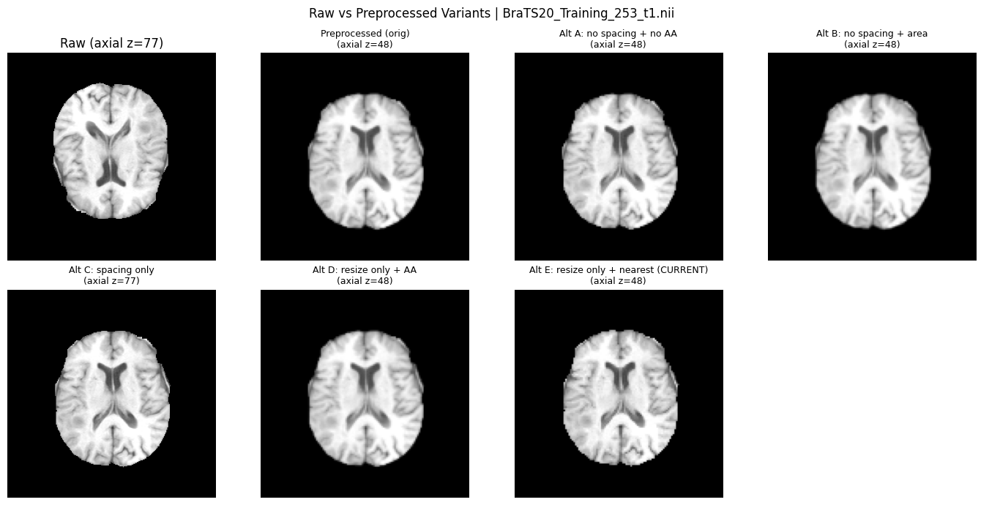

Raw shape: (240, 240, 155)
Preprocessed (orig) shape: (128, 128, 96)
Alt A: no spacing + no AA shape: (128, 128, 96)
Alt B: no spacing + area shape: (128, 128, 96)
Alt C: spacing only shape: (240, 240, 155)
Alt D: resize only + AA shape: (128, 128, 96)
Alt E: resize only + nearest (CURRENT) shape: (128, 128, 96)
Note: preprocessing applies Orientation/Spacing/Resize, so geometry can differ.


In [ ]:
# =========================
# Compare raw vs preprocessed (same case)
# =========================
import matplotlib.pyplot as plt
from typing import cast
from nibabel.spatialimages import SpatialImage

if len(val_files) == 0:
    raise RuntimeError("val_files is empty. Run data preparation cells first.")

compare_idx = 0
raw_path = Path(val_files[compare_idx]["image"])

raw_img = cast(SpatialImage, nib.load(str(raw_path)))
raw_vol = raw_img.get_fdata().astype(np.float32)
if raw_vol.ndim != 3:
    raise ValueError(f"Expected 3D volume, got shape {raw_vol.shape} for {raw_path}")

def _norm01_percentile(vol: np.ndarray, p_low: float = 0.5, p_high: float = 99.5) -> np.ndarray:
    vmin = np.percentile(vol, p_low)
    vmax = np.percentile(vol, p_high)
    vol = np.clip(vol, vmin, vmax)
    return (vol - vol.min()) / (vol.max() - vol.min() + 1e-8)

def _apply_variant(spacing: bool, resize: bool, resize_mode: str, resize_aa: bool) -> np.ndarray:
    ops = [
        LoadImaged(keys=["image"]),
        EnsureChannelFirstd(keys=["image"]),
        EnsureTyped(keys=["image"]),
        Orientationd(keys=["image"], axcodes="RAS"),
    ]
    if resize:
        ops.append(
            Resized(
                keys=["image"],
                spatial_size=TARGET_SHAPE,
                mode=(resize_mode,),
                anti_aliasing=resize_aa,
            )
        )
    ops.extend([
        ScaleIntensityRangePercentilesd(
            keys=["image"],
            lower=NORM_LOW_PCT,
            upper=NORM_HIGH_PCT,
            b_min=-1.0,
            b_max=1.0,
            clip=True,
        ),
        EnsureTyped(keys=["image"]),
    ])
    t = Compose(ops)
    sample = t({"image": str(raw_path)})
    vol = sample["image"] if isinstance(sample, dict) else sample
    vol = torch.as_tensor(vol) if not torch.is_tensor(vol) else vol
    return vol[0].detach().cpu().float().numpy()

variants = [
    {"name": "Preprocessed (orig)", "spacing": True, "resize": True, "mode": "trilinear", "aa": True},
    {"name": "Alt A: no spacing + no AA", "spacing": False, "resize": True, "mode": "trilinear", "aa": False},
    {"name": "Alt B: no spacing + area", "spacing": False, "resize": True, "mode": "area", "aa": False},
    {"name": "Alt C: spacing only", "spacing": True, "resize": False, "mode": "trilinear", "aa": False},
    {"name": "Alt D: resize only + AA", "spacing": False, "resize": True, "mode": "trilinear", "aa": True},
    {"name": "Alt E: resize only + nearest (CURRENT)", "spacing": False, "resize": True, "mode": "nearest", "aa": False},
 ]

raw_n = _norm01_percentile(raw_vol)
raw_mid = raw_n.shape[2] // 2

fig, axes = plt.subplots(2, 4, figsize=(14, 7))
axes = axes.flatten()

axes[0].imshow(raw_n[:, :, raw_mid].T, cmap="gray", origin="lower")
axes[0].set_title(f"Raw (axial z={raw_mid})")
axes[0].axis("off")

volumes = []
for v in variants:
    vol = _apply_variant(v["spacing"], v["resize"], v["mode"], v["aa"])
    volumes.append((v, vol))

for i, (v, vol) in enumerate(volumes, start=1):
    n = _norm01_percentile(vol)
    mid = n.shape[2] // 2
    axes[i].imshow(n[:, :, mid].T, cmap="gray", origin="lower")
    axes[i].set_title(f"{v['name']}\n(axial z={mid})", fontsize=9)
    axes[i].axis("off")

for j in range(len(volumes) + 1, len(axes)):
    axes[j].axis("off")

fig.suptitle(f"Raw vs Preprocessed Variants | {raw_path.name}")
plt.tight_layout()
plt.show()

print("Raw shape:", raw_vol.shape)
for v, vol in volumes:
    print(f"{v['name']} shape:", vol.shape)
print("Note: preprocessing applies Orientation/Spacing/Resize, so geometry can differ.")

In [ ]:
train_transforms = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    EnsureTyped(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    Resized(keys=["image"], spatial_size=TARGET_SHAPE, mode=("trilinear",)),
    ScaleIntensityRangePercentilesd(
        keys=["image"],
        lower=NORM_LOW_PCT,
        upper=NORM_HIGH_PCT,
        b_min=-1.0,
        b_max=1.0,
        clip=True,
    ),
    EnsureTyped(keys=["image"]),
])

val_transforms = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    EnsureTyped(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    Resized(keys=["image"], spatial_size=TARGET_SHAPE, mode=("trilinear",)),
    ScaleIntensityRangePercentilesd(
        keys=["image"],
        lower=NORM_LOW_PCT,
        upper=NORM_HIGH_PCT,
        b_min=-1.0,
        b_max=1.0,
        clip=True,
    ),
    EnsureTyped(keys=["image"]),
])

train_ds = Dataset(data=train_files, transform=train_transforms)
val_ds = Dataset(data=val_files, transform=val_transforms)

train_loader = DataLoader(
    train_ds,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=False,
    persistent_workers=(NUM_WORKERS > 0),
)
val_loader = DataLoader(
    val_ds,
    batch_size=1,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=False,
    persistent_workers=(NUM_WORKERS > 0),
)

print("Train batches:", len(train_loader))
print("Val batches  :", len(val_loader))

batch = next(iter(train_loader))
x = batch["image"]
print("Sample tensor shape:", tuple(x.shape))  # [B, 1, H, W, D]
print("Intensity min/max:", float(x.min()), float(x.max()))
if float(x.min()) < -1.05 or float(x.max()) > 1.05:
    print("Warning: intensity appears outside expected [-1, 1] range.")
else:
    print("Intensity check passed: data is in expected [-1, 1] range.")

Train batches: 345
Val batches  : 98
Sample tensor shape: (1, 1, 128, 128, 96)
Intensity min/max: -1.0 1.0
Intensity check passed: data is in expected [-1, 1] range.


In [ ]:
# Load pretrained autoencoder
autoencoder = AutoencoderKL(
    spatial_dims=3,
    in_channels=1,
    out_channels=1,
    num_channels=AE_NUM_CHANNELS,
    latent_channels=AE_LATENT_CHANNELS,
    num_res_blocks=2,
    norm_num_groups=16,
    attention_levels=(False, False, True),
).to(device)

ae_ckpt_dir = OUTPUT_ROOT / "checkpoints" / "autoencoder"
ae_best_path = ae_ckpt_dir / "autoencoder_best.pth"
if not ae_best_path.exists():
    raise FileNotFoundError(f"AE checkpoint not found: {ae_best_path}")
ae_ckpt = torch.load(ae_best_path, map_location=device)
autoencoder.load_state_dict(ae_ckpt["autoencoder_state_dict"])
autoencoder.eval()

AutoencoderKL(
  (encoder): Encoder(
    (blocks): ModuleList(
      (0): Convolution(
        (conv): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
      )
      (1-2): 2 x ResBlock(
        (norm1): GroupNorm(16, 32, eps=1e-06, affine=True)
        (conv1): Convolution(
          (conv): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
        )
        (norm2): GroupNorm(16, 32, eps=1e-06, affine=True)
        (conv2): Convolution(
          (conv): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
        )
        (nin_shortcut): Identity()
      )
      (3): Downsample(
        (conv): Convolution(
          (conv): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2))
        )
      )
      (4): ResBlock(
        (norm1): GroupNorm(16, 32, eps=1e-06, affine=True)
        (conv1): Convolution(
          (conv): Conv3d(32, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
        )
    

In [ ]:
# =========================
# Diffusion Model Setup (UNet, Scheduler, Optimizer)
# =========================
for _name in ["unet", "ema_unet", "noise_scheduler", "optimizer_diff", "scaler_diff", "lr_scheduler_diff"]:
    if _name in globals():
        try:
            obj = globals()[_name]
            if hasattr(obj, "to"):
                obj.to("cpu")
        except Exception:
            pass
        try:
            del globals()[_name]
        except Exception:
            pass
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()

latent_channels = int(AE_LATENT_CHANNELS)

unet = DiffusionModelUNet(
    spatial_dims=3,
    in_channels=latent_channels,
    out_channels=latent_channels,
    num_channels=DIFF_NUM_CHANNELS,
    attention_levels=tuple(ch > 0 for ch in DIFF_NUM_HEAD_CHANNELS),
    num_head_channels=DIFF_NUM_HEAD_CHANNELS,
    num_res_blocks=2,
    norm_num_groups=16,
).to(device)

ema_unet = copy.deepcopy(unet)

noise_scheduler = DDPMScheduler(
    num_train_timesteps=NUM_TRAIN_TIMESTEPS,
    beta_start=BETA_START,
    beta_end=BETA_END,
    schedule="scaled_linear_beta",
)

optimizer_diff = torch.optim.AdamW(unet.parameters(), lr=DIFF_LR, weight_decay=1e-6)
scaler_diff = GradScaler(enabled=use_amp)
lr_scheduler_diff = CosineAnnealingLR(optimizer_diff, T_max=DIFF_EPOCHS, eta_min=1e-6)

print("Diffusion model components initialized.")

Diffusion model components initialized.


In [ ]:
def train_diffusion_epoch(
    autoencoder, unet, ema_unet, noise_scheduler, loader, optimizer, scaler, device,
    scale_factor, grad_accum_steps=1, ema_decay=0.999, offset_noise=0.05
):
    autoencoder.eval()
    for p in autoencoder.parameters():
        p.requires_grad = False
    unet.train()
    running = 0.0
    pbar = tqdm(loader, desc="Diff Train", ncols=120)
    optimizer.zero_grad(set_to_none=True)
    for step, batch in enumerate(pbar):
        t1 = batch["image"].to(device)
        with torch.no_grad():
            z_t1 = autoencoder.encode_stage_2_inputs(t1) * scale_factor
        noise = torch.randn_like(z_t1)
        if offset_noise > 0:
            noise = noise + offset_noise * torch.randn(
                z_t1.shape[0], z_t1.shape[1], 1, 1, 1, device=device, dtype=z_t1.dtype
            )
        timesteps = torch.randint(
            0, noise_scheduler.num_train_timesteps, (z_t1.shape[0],), device=device, dtype=torch.long
        )
        noisy = noise_scheduler.add_noise(
            original_samples=z_t1, noise=noise, timesteps=timesteps
        )
        with autocast('cuda', enabled=use_amp):
            noise_pred = unet(noisy, timesteps=timesteps)
            if hasattr(noise_pred, "sample"):
                noise_pred = noise_pred.sample
            loss = F.mse_loss(noise_pred.float(), noise.float()) / grad_accum_steps
        scaler.scale(loss).backward()
        should_step = ((step + 1) % grad_accum_steps == 0) or (step + 1 == len(loader))
        if should_step:
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(unet.parameters(), max_norm=GRAD_CLIP)
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad(set_to_none=True)
            update_ema(ema_unet, unet, decay=ema_decay)
        running += loss.item() * grad_accum_steps
        avg_loss = running / (step + 1)
        pbar.set_postfix(train_loss=f"{avg_loss:.4f}", lr=f"{optimizer.param_groups[0]['lr']:.2e}")
    return running / max(1, len(loader))

@torch.no_grad()
def validate_diffusion_epoch(
    autoencoder, eval_unet, noise_scheduler, loader, device, scale_factor, seed=1234
):
    autoencoder.eval()
    eval_unet.eval()
    running = 0.0
    g = torch.Generator(device=device).manual_seed(seed)
    pbar = tqdm(loader, desc="Diff Val", ncols=120)
    for step, batch in enumerate(pbar):
        t1 = batch["image"].to(device)
        z_t1 = autoencoder.encode_stage_2_inputs(t1) * scale_factor
        noise = torch.randn(z_t1.shape, generator=g, device=device, dtype=z_t1.dtype)
        timesteps = torch.randint(
            0, noise_scheduler.num_train_timesteps, (z_t1.shape[0],), generator=g, device=device
        ).long()
        noisy = noise_scheduler.add_noise(
            original_samples=z_t1, noise=noise, timesteps=timesteps
        )
        with autocast('cuda', enabled=use_amp):
            noise_pred = eval_unet(noisy, timesteps=timesteps)
            if hasattr(noise_pred, "sample"):
                noise_pred = noise_pred.sample
            loss = F.mse_loss(noise_pred.float(), noise.float())
        running += loss.item()
        pbar.set_postfix(val_loss=f"{running / (step + 1):.4f}")
    return running / max(1, len(loader))

@torch.no_grad()
def estimate_scale_factor(autoencoder, loader, device, num_samples=256):
    autoencoder.eval()
    latents = []

    for step, batch in enumerate(loader):
        if step * loader.batch_size >= num_samples:
            break

        t1 = batch["image"].to(device)
        z = autoencoder.encode_stage_2_inputs(t1)
        latents.append(z.detach().cpu())

    if not latents:
        print("Warning: no samples processed for scale factor estimation. Using default=1.0")
        return 1.0

    z_all = torch.cat(latents, dim=0)
    scale_factor = 1.0 / z_all.std()

    return float(scale_factor)

def update_ema(ema_model, model, decay=0.9999):
    with torch.no_grad():
        for ema_param, param in zip(ema_model.parameters(), model.parameters()):
            ema_param.data.mul_(decay).add_(param.data, alpha=1 - decay)

In [ ]:
# ============================================================
# Continue Diffusion Training - Safe Resume Setup
# ============================================================

FORCE_DIFF_RETRAIN = False      # IMPORTANT: continue training, do not restart

# Continue until this total epoch number
# Example: if latest checkpoint is epoch 260, this continues to epoch 350
DIFF_EPOCHS = 350

# Safer LR for fine-tuning / continuing training
DIFF_LR = 1e-5

# Stability settings
OFFSET_NOISE = 0.03
GRAD_CLIP = 1.0
DIFF_EARLY_STOP_PATIENCE = 80
DIFF_EARLY_STOP_MIN_DELTA = 1e-5

# Preview settings
PREVIEW_EVERY = 10

# Checkpoint paths
diff_ckpt_dir = OUTPUT_ROOT / "checkpoints" / "diffusion"
diff_ckpt_dir.mkdir(parents=True, exist_ok=True)

diff_latest_path = diff_ckpt_dir / "latent_diffusion_latest.pth"
diff_best_path = diff_ckpt_dir / "latent_diffusion_best.pth"

best_diff_val = float("inf")
diff_start_epoch = 0
diff_patience_counter = 0
scale_factor_runtime = 1.0

# ============================================================
# Load latest checkpoint
# ============================================================

if diff_latest_path.exists() and not FORCE_DIFF_RETRAIN:
    print("Loading latest diffusion checkpoint...")

    d_ckpt = torch.load(diff_latest_path, map_location=device)

    unet.load_state_dict(d_ckpt["unet_state_dict"])
    ema_unet.load_state_dict(d_ckpt["ema_unet_state_dict"])
    optimizer_diff.load_state_dict(d_ckpt["optimizer_state_dict"])
    scaler_diff.load_state_dict(d_ckpt["scaler_state_dict"])
    lr_scheduler_diff.load_state_dict(d_ckpt["lr_scheduler_state_dict"])

    scale_factor_runtime = float(d_ckpt.get("scale_factor", scale_factor_runtime))
    diff_start_epoch = int(d_ckpt.get("epoch", 0))
    best_diff_val = float(d_ckpt.get("best_val_loss", best_diff_val))
    diff_patience_counter = int(d_ckpt.get("diff_patience_counter", 0))

    # Force safer fine-tuning LR after loading optimizer state
    for param_group in optimizer_diff.param_groups:
        param_group["lr"] = DIFF_LR

    print(f"Resuming diffusion training from epoch {diff_start_epoch}")
    print(f"Continuing until epoch {DIFF_EPOCHS}")
    print(f"Best val loss so far: {best_diff_val:.6f}")
    print(f"Scale factor: {scale_factor_runtime:.6f}")
    print(f"Forced resumed LR: {optimizer_diff.param_groups[0]['lr']}")

else:
    print("No checkpoint found, or FORCE_DIFF_RETRAIN=True.")
    print("Starting diffusion training from scratch.")

    scale_factor_runtime = float(
        estimate_scale_factor(autoencoder, train_loader, device)
    )

    print(f"Estimated scale_factor={scale_factor_runtime:.6f}")

# ============================================================
# Optional: reset LR scheduler for continued training
# This avoids weird scheduler state after resuming.
# ============================================================

lr_scheduler_diff = CosineAnnealingLR(
    optimizer_diff,
    T_max=max(1, DIFF_EPOCHS - diff_start_epoch),
    eta_min=1e-6,
)

print("Resume setup complete.")
print("Start epoch:", diff_start_epoch)
print("Target epoch:", DIFF_EPOCHS)
print("Current LR:", optimizer_diff.param_groups[0]["lr"])

Loading latest diffusion checkpoint...
Resuming diffusion training from epoch 85
Continuing until epoch 350
Best val loss so far: 0.351399
Scale factor: 1.000692
Forced resumed LR: 1e-05
Resume setup complete.
Start epoch: 85
Target epoch: 350
Current LR: 1e-05


Estimated scale_factor=1.000692


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 1/350 | val_mse=0.415073


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 2/350 | val_mse=0.404650


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 3/350 | val_mse=0.466692


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 4/350 | val_mse=0.410597


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 5/350 | val_mse=0.387824


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 6/350 | val_mse=0.403457


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 7/350 | val_mse=0.432588


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 8/350 | val_mse=0.383286


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 9/350 | val_mse=0.404361


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 10/350 | val_mse=0.406554

Generating preview sample at epoch 10...


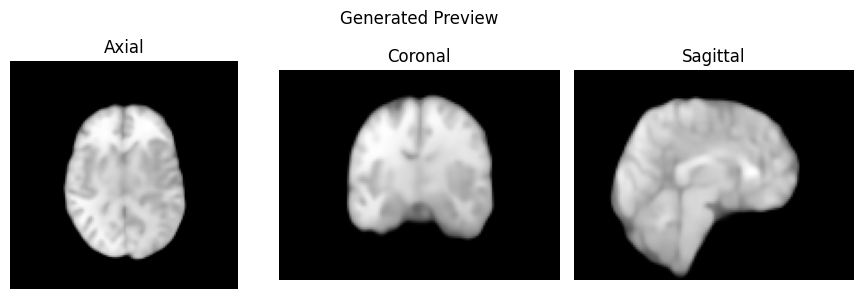

Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 11/350 | val_mse=0.429351


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 12/350 | val_mse=0.404074


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 13/350 | val_mse=0.410222


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 14/350 | val_mse=0.431543


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 15/350 | val_mse=0.385739


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 16/350 | val_mse=0.361209


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 17/350 | val_mse=0.465377


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 18/350 | val_mse=0.385030


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 19/350 | val_mse=0.375228


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 20/350 | val_mse=0.411231

Generating preview sample at epoch 20...


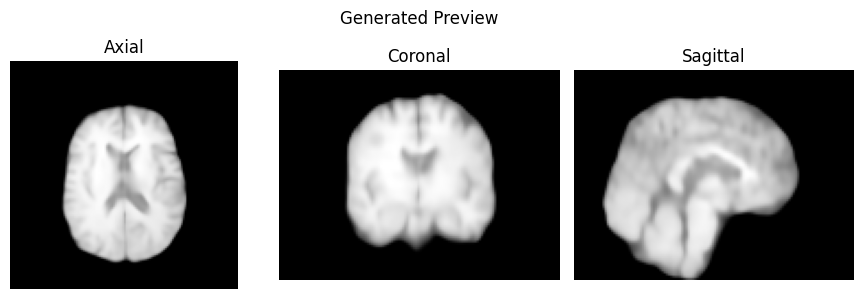

Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 21/350 | val_mse=0.422084


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 22/350 | val_mse=0.409994


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 23/350 | val_mse=0.412927


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 24/350 | val_mse=0.385163


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 25/350 | val_mse=0.414014


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 26/350 | val_mse=0.431407


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 27/350 | val_mse=0.454427


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 28/350 | val_mse=0.418053


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 29/350 | val_mse=0.444863


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 30/350 | val_mse=0.458242

Generating preview sample at epoch 30...


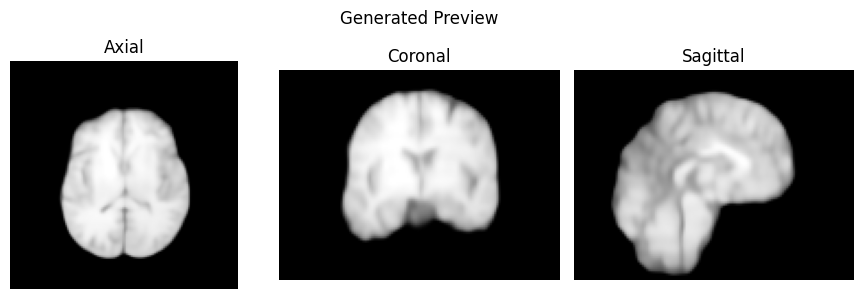

Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 31/350 | val_mse=0.355858


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 32/350 | val_mse=0.396783


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 33/350 | val_mse=0.376870


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 34/350 | val_mse=0.415931


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 35/350 | val_mse=0.429895


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 36/350 | val_mse=0.419969


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 37/350 | val_mse=0.480306


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 38/350 | val_mse=0.412699


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 39/350 | val_mse=0.457323


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 40/350 | val_mse=0.398187

Generating preview sample at epoch 40...


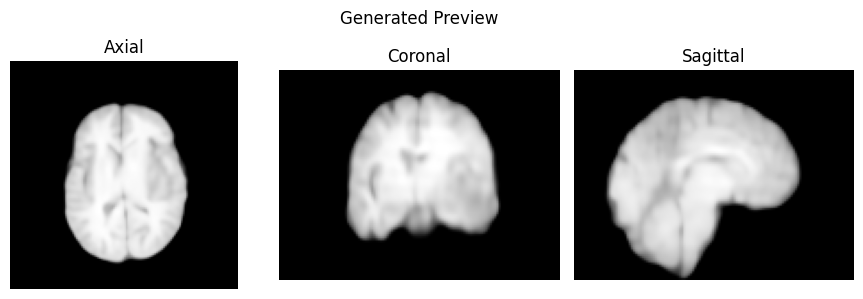

Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 41/350 | val_mse=0.416307


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 42/350 | val_mse=0.442417


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 43/350 | val_mse=0.422797


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 44/350 | val_mse=0.412627


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 45/350 | val_mse=0.433826


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 46/350 | val_mse=0.413477


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 47/350 | val_mse=0.383475


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 48/350 | val_mse=0.375026


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 49/350 | val_mse=0.389275


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 50/350 | val_mse=0.471702

Generating preview sample at epoch 50...


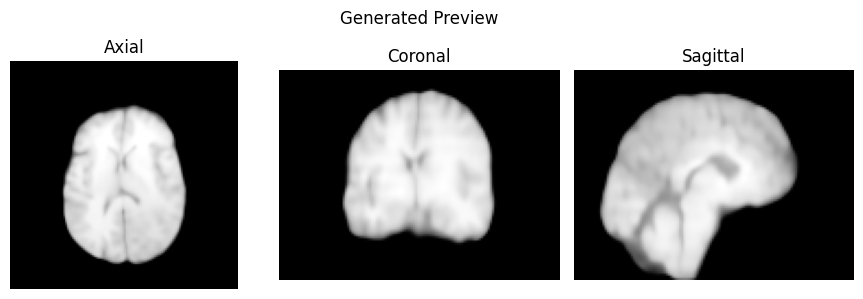

Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 51/350 | val_mse=0.424619


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 52/350 | val_mse=0.457660


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 53/350 | val_mse=0.388462


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 54/350 | val_mse=0.395726


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 55/350 | val_mse=0.428722


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 56/350 | val_mse=0.409924


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 57/350 | val_mse=0.411375


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 58/350 | val_mse=0.427925


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 59/350 | val_mse=0.467197


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 60/350 | val_mse=0.468806

Generating preview sample at epoch 60...


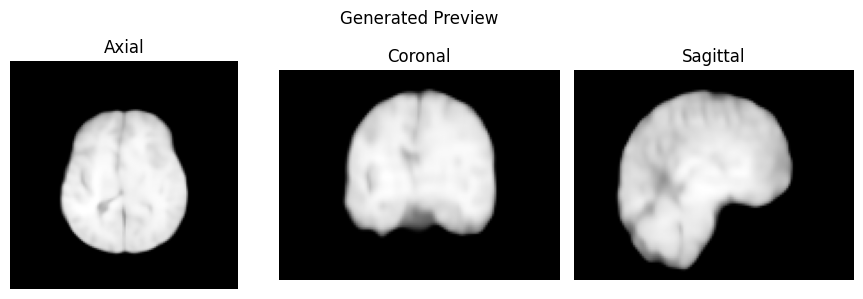

Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 61/350 | val_mse=0.394438


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 62/350 | val_mse=0.420877


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 63/350 | val_mse=0.373037


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 64/350 | val_mse=0.396071


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 65/350 | val_mse=0.361501


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 66/350 | val_mse=0.445086


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 67/350 | val_mse=0.392437


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 68/350 | val_mse=0.394530


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 69/350 | val_mse=0.360861


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 70/350 | val_mse=0.448748

Generating preview sample at epoch 70...


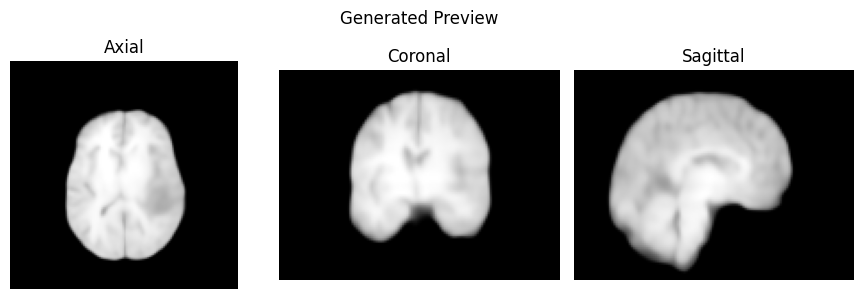

Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 71/350 | val_mse=0.438556


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 72/350 | val_mse=0.384039


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 73/350 | val_mse=0.411491


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 74/350 | val_mse=0.390081


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 75/350 | val_mse=0.361713


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 76/350 | val_mse=0.373726


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 77/350 | val_mse=0.380031


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 78/350 | val_mse=0.364613


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 79/350 | val_mse=0.397456


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 80/350 | val_mse=0.453752

Generating preview sample at epoch 80...


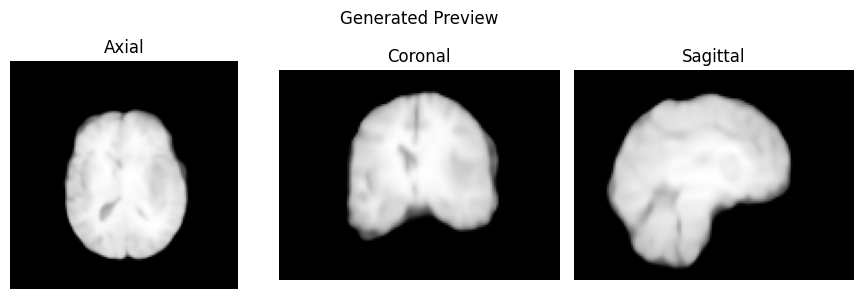

Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 81/350 | val_mse=0.351399


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 82/350 | val_mse=0.423938


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 83/350 | val_mse=0.428977


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 84/350 | val_mse=0.429005


Diff Train:   0%|                                                                               | 0/345 [00:00…

Diff Val:   0%|                                                                                  | 0/98 [00:00…

Diff Epoch 85/350 | val_mse=0.384166


Diff Train:   0%|                                                                               | 0/345 [00:00…

KeyboardInterrupt: 

In [ ]:
diff_ckpt_dir = OUTPUT_ROOT / "checkpoints" / "diffusion"
diff_ckpt_dir.mkdir(parents=True, exist_ok=True)
diff_latest_path = diff_ckpt_dir / "latent_diffusion_latest.pth"
diff_best_path = diff_ckpt_dir / "latent_diffusion_best_1.pth"
FORCE_DIFF_RETRAIN = True
best_diff_val = float("inf")
diff_start_epoch = 0
diff_patience_counter = 0
scale_factor_runtime = 1.0

if diff_latest_path.exists() and not FORCE_DIFF_RETRAIN:
    d_ckpt = torch.load(diff_latest_path, map_location=device)
    unet.load_state_dict(d_ckpt["unet_state_dict"])
    ema_unet.load_state_dict(d_ckpt["ema_unet_state_dict"])
    optimizer_diff.load_state_dict(d_ckpt["optimizer_state_dict"])
    scaler_diff.load_state_dict(d_ckpt["scaler_state_dict"])
    lr_scheduler_diff.load_state_dict(d_ckpt["lr_scheduler_state_dict"])
    scale_factor_runtime = float(d_ckpt.get("scale_factor", scale_factor_runtime))
    diff_start_epoch = int(d_ckpt.get("epoch", 0))
    best_diff_val = float(d_ckpt.get("best_val_loss", best_diff_val))
    print(f"Resuming Diffusion from epoch {diff_start_epoch}")

if diff_start_epoch == 0:
    scale_factor_runtime = float(estimate_scale_factor(autoencoder, train_loader, device))
    print(f"Estimated scale_factor={scale_factor_runtime:.6f}")

PREVIEW_EVERY = 10

@torch.no_grad()
def preview_generation(autoencoder, unet, scheduler, device, scale_factor, seed=999):
    autoencoder.eval()
    unet.eval()

    g = torch.Generator(device=device).manual_seed(seed)

    z = torch.randn(
        1,
        AE_LATENT_CHANNELS,
        32, 32, 24,
        device=device,
        generator=g,
    )

    scheduler.set_timesteps(NUM_TRAIN_TIMESTEPS)

    for t in scheduler.timesteps:
        timesteps = torch.tensor([int(t)], device=device).long()

        noise_pred = unet(z, timesteps=timesteps)
        if hasattr(noise_pred, "sample"):
            noise_pred = noise_pred.sample

        step_output = scheduler.step(noise_pred, t, z)

        if hasattr(step_output, "prev_sample"):
            z = step_output.prev_sample
        elif isinstance(step_output, tuple):
            z = step_output[0]
        else:
            z = step_output

    x = autoencoder.decode(z / scale_factor)

    vol = x[0, 0].detach().cpu().float().numpy()
    vol = np.clip(vol, -1, 1)
    vol01 = (vol + 1) / 2

    fig, axes = plt.subplots(1, 3, figsize=(9, 3))
    fig.suptitle("Generated Preview")

    axes[0].imshow(vol01[:, :, vol01.shape[2] // 2].T, cmap="gray", origin="lower")
    axes[0].set_title("Axial")

    axes[1].imshow(vol01[:, vol01.shape[1] // 2, :].T, cmap="gray", origin="lower")
    axes[1].set_title("Coronal")

    axes[2].imshow(vol01[vol01.shape[0] // 2, :, :].T, cmap="gray", origin="lower")
    axes[2].set_title("Sagittal")

    for ax in axes:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

for epoch in range(diff_start_epoch, DIFF_EPOCHS):
    tr = train_diffusion_epoch(autoencoder, unet, ema_unet, noise_scheduler, train_loader, optimizer_diff, scaler_diff, device, scale_factor_runtime, GRAD_ACCUM_STEPS, EMA_DECAY, OFFSET_NOISE)
    va = validate_diffusion_epoch(autoencoder, ema_unet, noise_scheduler, val_loader, device, scale_factor_runtime, 1234 + epoch)
    lr_scheduler_diff.step()
    print(f"Diff Epoch {epoch + 1}/{DIFF_EPOCHS} | val_mse={va:.6f}")

    if (epoch + 1) % PREVIEW_EVERY == 0:
        print(f"\nGenerating preview sample at epoch {epoch + 1}...")

        preview_generation(
            autoencoder,
            ema_unet,
            noise_scheduler,
            device,
            scale_factor_runtime,
        )

    improved = va < (best_diff_val - DIFF_EARLY_STOP_MIN_DELTA)
    if improved:
        best_diff_val = va
        diff_patience_counter = 0
    else:
        diff_patience_counter += 1
    d_state = {
        "epoch": epoch + 1,
        "unet_state_dict": unet.state_dict(),
        "ema_unet_state_dict": ema_unet.state_dict(),
        "optimizer_state_dict": optimizer_diff.state_dict(),
        "scaler_state_dict": scaler_diff.state_dict(),
        "lr_scheduler_state_dict": lr_scheduler_diff.state_dict(),
        "best_val_loss": best_diff_val,
        "diff_patience_counter": diff_patience_counter,
        "scale_factor": scale_factor_runtime,
    }
    torch.save(d_state, diff_latest_path)
    if improved:
        torch.save(d_state, diff_best_path)
    if SAVE_EVERY > 0 and (epoch + 1) % SAVE_EVERY == 0:
        torch.save(d_state, diff_ckpt_dir / f"diff_{epoch+1:04d}.pth")
    if diff_patience_counter >= DIFF_EARLY_STOP_PATIENCE:
        break

inference

In [ ]:
# ============================================================
# Synthetic T1 Synthesis Config
# ============================================================

from generative.networks.schedulers import DDIMScheduler
import nibabel as nib
import numpy as np
import torch
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm.auto import tqdm

SYNTH_NUM_SAMPLES = 1000         # change to 1000 later for FID/KID
SYNTH_BATCH_SIZE = 1
SYNTH_INFERENCE_STEPS = 1000     # try 200, 300, 500, 1000
SYNTH_SEED = 999

synthetic_output_dir = OUTPUT_ROOT / "generated_synthetic_t1"
synthetic_output_dir.mkdir(parents=True, exist_ok=True)

print("Synthetic output dir:", synthetic_output_dir)

Synthetic output dir: /content/drive/MyDrive/MDS03_Backend_outputs/synthetic_t1_3d_ldm/generated_synthetic_t1


In [ ]:
# ============================================================
# Load Best Diffusion Checkpoint for Synthesis
# ============================================================
# best1 > 50
best_ckpt_path = OUTPUT_ROOT / "checkpoints" / "diffusion" / "50.pth"

if not best_ckpt_path.exists():
    raise FileNotFoundError(f"Best diffusion checkpoint not found: {best_ckpt_path}")

ckpt = torch.load(best_ckpt_path, map_location=device)

unet.load_state_dict(ckpt["unet_state_dict"])
ema_unet.load_state_dict(ckpt["ema_unet_state_dict"])

scale_factor_runtime = float(ckpt["scale_factor"])
synth_unet = ema_unet

autoencoder.eval()
synth_unet.eval()

print("Loaded best checkpoint:", best_ckpt_path)
print("Scale factor:", scale_factor_runtime)

Loaded best checkpoint: /content/drive/MyDrive/MDS03_Backend_outputs/synthetic_t1_3d_ldm/checkpoints/diffusion/latent_diffusion_best.pth
Scale factor: 1.0006691217422485


In [ ]:
# ============================================================
# Infer Latent Shape from Autoencoder
# ============================================================

@torch.no_grad()
def get_latent_spatial_shape(autoencoder, device, target_shape):
    autoencoder.eval()

    dummy = torch.zeros(1, 1, *target_shape, device=device)
    z = autoencoder.encode_stage_2_inputs(dummy)

    print("Input shape :", tuple(dummy.shape))
    print("Latent shape:", tuple(z.shape))

    return tuple(z.shape[2:])

LATENT_SPATIAL_SHAPE = get_latent_spatial_shape(
    autoencoder=autoencoder,
    device=device,
    target_shape=TARGET_SHAPE,
)

print("LATENT_SPATIAL_SHAPE =", LATENT_SPATIAL_SHAPE)

Input shape : (1, 1, 128, 128, 96)
Latent shape: (1, 8, 32, 32, 24)
LATENT_SPATIAL_SHAPE = (32, 32, 24)


In [ ]:
# ============================================================
# DDIM Scheduler for Faster Synthesis
# ============================================================

ddpm_inference_scheduler = DDPMScheduler(
    num_train_timesteps=SYNTH_INFERENCE_STEPS,
    beta_start=BETA_START,
    beta_end=BETA_END,
    schedule="scaled_linear_beta",
)

ddpm_inference_scheduler.set_timesteps(SYNTH_INFERENCE_STEPS)

print("Scheduler:", type(ddpm_inference_scheduler).__name__)
print("Inference steps:", len(ddpm_inference_scheduler.timesteps))
print("First timestep:", ddpm_inference_scheduler.timesteps[0])
print("Last timestep:", ddpm_inference_scheduler.timesteps[-1])

Scheduler: DDPMScheduler
Inference steps: 1000
First timestep: tensor(999)
Last timestep: tensor(0)


In [ ]:
# ============================================================
# Generate Synthetic T1 Volume
# ============================================================

@torch.no_grad()
def synthesize_t1_volume(
    autoencoder,
    unet,
    scheduler,
    device,
    scale_factor,
    latent_spatial_shape,
    batch_size=1,
    seed=None,
):
    autoencoder.eval()
    unet.eval()

    if seed is not None:
        g = torch.Generator(device=device).manual_seed(seed)
    else:
        g = None

    z = torch.randn(
        batch_size,
        AE_LATENT_CHANNELS,
        *latent_spatial_shape,
        device=device,
        generator=g,
    )

    for t in tqdm(scheduler.timesteps, desc="Denoising", leave=False):
        t_val = t.item() if torch.is_tensor(t) else int(t)

        timesteps = torch.full(
            (batch_size,),
            int(t_val),
            device=device,
            dtype=torch.long,
        )

        noise_pred = unet(z, timesteps=timesteps)

        if hasattr(noise_pred, "sample"):
            noise_pred = noise_pred.sample

        step_output = scheduler.step(noise_pred, t, z)

        if hasattr(step_output, "prev_sample"):
            z = step_output.prev_sample
        elif isinstance(step_output, tuple):
            z = step_output[0]
        else:
            z = step_output

    x = autoencoder.decode(z / scale_factor)

    x = torch.clamp(x, -1.0, 1.0)

    return x

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

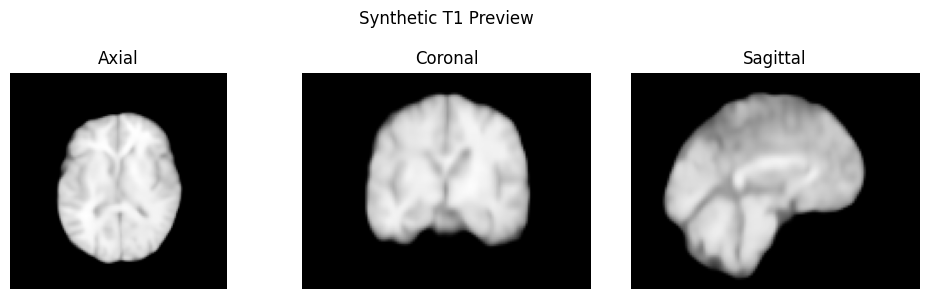

Generated volume shape: (128, 128, 96)
Range: min=-1.0000, max=1.0000, mean=-0.7362, std=0.6010


In [ ]:
# ============================================================
# Preview One Synthetic T1
# ============================================================

x_gen = synthesize_t1_volume(
    autoencoder=autoencoder,
    unet=synth_unet,
    scheduler=ddpm_inference_scheduler,
    device=device,
    scale_factor=scale_factor_runtime,
    latent_spatial_shape=LATENT_SPATIAL_SHAPE,
    batch_size=1,
    seed=SYNTH_SEED,
)

vol = x_gen[0, 0].detach().cpu().float().numpy()
vol01 = (vol + 1.0) / 2.0

x_mid = vol01.shape[0] // 2
y_mid = vol01.shape[1] // 2
z_mid = vol01.shape[2] // 2

fig, axes = plt.subplots(1, 3, figsize=(10, 3))
fig.suptitle("Synthetic T1 Preview")

axes[0].imshow(vol01[:, :, z_mid].T, cmap="gray", origin="lower", vmin=0, vmax=1)
axes[0].set_title("Axial")

axes[1].imshow(vol01[:, y_mid, :].T, cmap="gray", origin="lower", vmin=0, vmax=1)
axes[1].set_title("Coronal")

axes[2].imshow(vol01[x_mid, :, :].T, cmap="gray", origin="lower", vmin=0, vmax=1)
axes[2].set_title("Sagittal")

for ax in axes:
    ax.axis("off")

plt.tight_layout()
plt.show()

print("Generated volume shape:", vol.shape)
print(f"Range: min={vol.min():.4f}, max={vol.max():.4f}, mean={vol.mean():.4f}, std={vol.std():.4f}")

(128, 128, 96)
-1.0 1.0


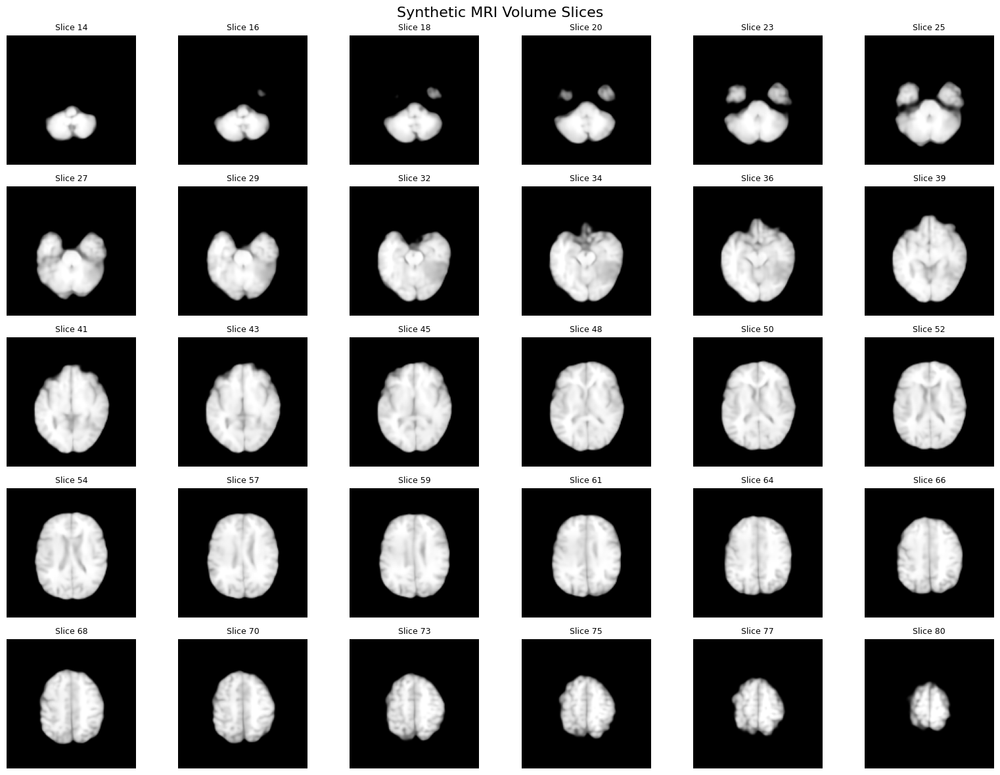

In [ ]:
# ============================================================
# Plot Multiple Axial Slices from Synthetic Volume
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
# x_gen shape: [B, 1, H, W, D]

volume = x_gen[0, 0].detach().cpu().float().numpy()

print(volume.shape)
print(volume.min(), volume.max())
# volume shape: [H, W, D]
# expected range: [-1, 1]

# ------------------------------------------------------------
# Normalize to [0, 1]
# ------------------------------------------------------------

volume01 = np.clip(volume, -1.0, 1.0)
volume01 = (volume01 + 1.0) / 2.0

# ------------------------------------------------------------
# Select slices
# ------------------------------------------------------------

num_slices = 30
depth = volume01.shape[2]

# avoid very empty top/bottom slices
start = int(depth * 0.15)
end = int(depth * 0.85)

slice_indices = np.linspace(
    start,
    end - 1,
    num_slices
).astype(int)

# remove accidental duplicates
slice_indices = np.unique(slice_indices)

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig, axes = plt.subplots(
    5,
    6,
    figsize=(16, 12)
)

axes = axes.flatten()

fig.suptitle(
    "Synthetic MRI Volume Slices",
    fontsize=16
)

for ax, idx in zip(axes, slice_indices):

    slice_img = volume01[:, :, idx]

    ax.imshow(
    np.rot90(slice_img),
    cmap="gray",
    vmin=np.percentile(slice_img, 1),
    vmax=np.percentile(slice_img, 99),
)

    ax.set_title(f"Slice {idx}", fontsize=9)
    ax.axis("off")

# hide unused axes
for ax in axes[len(slice_indices):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# Generate and Save Multiple Synthetic T1 Volumes
# ============================================================

preprocessed_affine = np.diag([
    TARGET_PIXDIM[0],
    TARGET_PIXDIM[1],
    TARGET_PIXDIM[2],
    1.0,
])

saved_paths = []

for idx in tqdm(range(SYNTH_NUM_SAMPLES), desc="Saving synthetic T1 volumes"):
    x_gen = synthesize_t1_volume(
        autoencoder=autoencoder,
        unet=synth_unet,
        scheduler=ddpm_inference_scheduler,
        device=device,
        scale_factor=scale_factor_runtime,
        latent_spatial_shape=LATENT_SPATIAL_SHAPE,
        batch_size=1,
        seed=SYNTH_SEED + idx,
    )

    vol_np = x_gen[0, 0].detach().cpu().float().numpy()
    vol_np = np.clip(vol_np, -1.0, 1.0)

    output_path = synthetic_output_dir / f"synthetic_t1_{idx:05d}.nii.gz"

    nifti_img = nib.Nifti1Image(
        vol_np.astype(np.float32),
        affine=preprocessed_affine,
    )

    nib.save(nifti_img, str(output_path))
    saved_paths.append(output_path)

print(f"Saved {len(saved_paths)} synthetic T1 volumes.")
print("Output folder:", synthetic_output_dir)

Saving synthetic T1 volumes:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Denoising:   0%|          | 0/1000 [00:00<?, ?it/s]

Saved 1000 synthetic T1 volumes.
Output folder: /content/drive/MyDrive/MDS03_Backend_outputs/synthetic_t1_3d_ldm/generated_synthetic_t1


In [ ]:
# ============================================================
# 1K-volume matched-slice FID for 3D MRI volumes
# ============================================================

!pip install -q torchmetrics torch-fidelity nibabel tqdm

import random
from pathlib import Path
import numpy as np
import nibabel as nib
import torch
import torch.nn.functional as F
from tqdm import tqdm
from torchmetrics.image.fid import FrechetInceptionDistance

# ============================================================
# Config
# ============================================================

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

# Change these paths
REAL_VOLUME_ROOT = Path("/content/extracted_datasets/final-clean-data/T1")
SYNTH_VOLUME_ROOT = Path("/content/drive/MyDrive/MDS03_Backend_outputs/synthetic_t1_3d_ldm/generated_synthetic_t1")

MAX_REAL_VOLUMES = 494
MAX_SYNTH_VOLUMES = 494

FID_IMAGE_SIZE = 299
FID_SLICE_AXIS = 2

# Use representative slices, not edge slices
FID_SLICE_PERCENTAGES = np.array(
    [0.15, 0.325, 0.50, 0.675, 0.85],
    dtype=np.float32
)

TARGET_SHAPE = None  # Set to (96, 96, 64) if you want forced resizing

Device: cuda


In [ ]:
# ============================================================
# Helper functions
# ============================================================

def is_nifti_file(path):
    name = str(path).lower()
    return name.endswith(".nii") or name.endswith(".nii.gz")


def find_nifti_files(root):
    root = Path(root)
    files = [
        p for p in root.rglob("*")
        if p.is_file() and is_nifti_file(p)
    ]
    return sorted(files)


def load_volume(path):
    vol = nib.load(str(path)).get_fdata().astype(np.float32)

    if vol.ndim == 4:
        vol = vol[..., 0]

    if vol.ndim != 3:
        raise ValueError(f"Expected 3D volume, got shape {vol.shape}: {path}")

    return vol


def resize_volume_to_target(volume, target_shape):
    if target_shape is None:
        return volume.astype(np.float32)

    if tuple(volume.shape) == tuple(target_shape):
        return volume.astype(np.float32)

    with torch.no_grad():
        vol_t = torch.from_numpy(volume).float().unsqueeze(0).unsqueeze(0)
        vol_t = F.interpolate(
            vol_t,
            size=target_shape,
            mode="trilinear",
            align_corners=False
        )
        return vol_t[0, 0].cpu().numpy().astype(np.float32)


def normalize_volume_to_01(volume):
    """
    Robust per-volume normalization for MRI.
    """
    volume = volume.astype(np.float32)

    nonzero = volume[volume > 0]

    if len(nonzero) > 100:
        low, high = np.percentile(nonzero, [1, 99])
    else:
        low, high = np.percentile(volume, [1, 99])

    volume = np.clip(volume, low, high)

    min_val = volume.min()
    max_val = volume.max()

    if max_val - min_val < 1e-8:
        return np.zeros_like(volume, dtype=np.float32)

    volume = (volume - min_val) / (max_val - min_val)

    return volume.astype(np.float32)


def get_slice_indices(volume, axis=2, percentages=FID_SLICE_PERCENTAGES):
    depth = volume.shape[axis]

    indices = np.round(percentages * (depth - 1)).astype(int)
    indices = np.clip(indices, 0, depth - 1)

    return indices


def get_slices(volume, indices, axis=2):
    slices = []

    for idx in indices:
        idx = int(idx)

        if axis == 0:
            sl = volume[idx, :, :]
        elif axis == 1:
            sl = volume[:, idx, :]
        else:
            sl = volume[:, :, idx]

        slices.append(sl.astype(np.float32))

    return slices


def slice_to_fid_tensor(slice_2d, image_size=299):
    """
    TorchMetrics FID expects uint8 RGB images when normalize=False.
    """
    img = np.asarray(slice_2d, dtype=np.float32)
    img = np.clip(img, 0.0, 1.0)

    t = torch.from_numpy(img).unsqueeze(0).unsqueeze(0).float()
    t = F.interpolate(
        t,
        size=(image_size, image_size),
        mode="bilinear",
        align_corners=False
    )

    t = t.repeat(1, 3, 1, 1)
    t = (t * 255.0).round().clamp(0, 255).to(torch.uint8)

    return t

# ============================================================
# Load up to 1K real and 1K synthetic volumes
# ============================================================

real_files = find_nifti_files(REAL_VOLUME_ROOT)
synth_files = find_nifti_files(SYNTH_VOLUME_ROOT)

print("Real volumes found:", len(real_files))
print("Synthetic/comparison volumes found:", len(synth_files))

if len(real_files) == 0:
    raise RuntimeError(f"No real NIfTI volumes found in {REAL_VOLUME_ROOT}")

if len(synth_files) == 0:
    raise RuntimeError(f"No synthetic/comparison NIfTI volumes found in {SYNTH_VOLUME_ROOT}")

random.shuffle(real_files)
random.shuffle(synth_files)

real_files = real_files[:MAX_REAL_VOLUMES]
synth_files = synth_files[:MAX_SYNTH_VOLUMES]

print("Real volumes used:", len(real_files))
print("Synthetic/comparison volumes used:", len(synth_files))

Real volumes found: 494
Synthetic/comparison volumes found: 1000
Real volumes used: 494
Synthetic/comparison volumes used: 494


In [ ]:
# ============================================================
# Compute matched-slice FID
# ============================================================

fid = FrechetInceptionDistance(
    feature=2048,
    normalize=False
).to(device)

real_slice_count = 0
synth_slice_count = 0

print("\nUpdating FID with real volumes...")

for path in tqdm(real_files, desc="Real FID volumes"):
    try:
        vol = load_volume(path)
        vol = resize_volume_to_target(vol, TARGET_SHAPE)
        vol = normalize_volume_to_01(vol)

        indices = get_slice_indices(
            vol,
            axis=FID_SLICE_AXIS,
            percentages=FID_SLICE_PERCENTAGES
        )

        slices = get_slices(
            vol,
            indices,
            axis=FID_SLICE_AXIS
        )

        for sl in slices:
            img = slice_to_fid_tensor(sl, FID_IMAGE_SIZE).to(device)
            fid.update(img, real=True)
            real_slice_count += 1

    except Exception as e:
        print("Skipped real:", path, "|", e)


print("\nUpdating FID with synthetic/comparison volumes...")

for path in tqdm(synth_files, desc="Synthetic FID volumes"):
    try:
        vol = load_volume(path)
        vol = resize_volume_to_target(vol, TARGET_SHAPE)
        vol = normalize_volume_to_01(vol)

        indices = get_slice_indices(
            vol,
            axis=FID_SLICE_AXIS,
            percentages=FID_SLICE_PERCENTAGES
        )

        slices = get_slices(
            vol,
            indices,
            axis=FID_SLICE_AXIS
        )

        for sl in slices:
            img = slice_to_fid_tensor(sl, FID_IMAGE_SIZE).to(device)
            fid.update(img, real=False)
            synth_slice_count += 1

    except Exception as e:
        print("Skipped synthetic:", path, "|", e)


fid_score = float(fid.compute().detach().cpu().item())

print("\n===== FID RESULT =====")
print("Real volumes used:", len(real_files))
print("Synthetic/comparison volumes used:", len(synth_files))
print("Real slices used:", real_slice_count)
print("Synthetic/comparison slices used:", synth_slice_count)
print(f"Matched-slice Inception FID: {fid_score:.4f}")


Updating FID with real volumes...


Real FID volumes: 100%|██████████| 494/494 [01:57<00:00,  4.20it/s]



Updating FID with synthetic/comparison volumes...


Synthetic FID volumes: 100%|██████████| 494/494 [01:15<00:00,  6.52it/s]



===== FID RESULT =====
Real volumes used: 494
Synthetic/comparison volumes used: 494
Real slices used: 2470
Synthetic/comparison slices used: 2470
Matched-slice Inception FID: 112.5451


In [ ]:
# ============================================================
# KID (Kernel Inception Distance)
# ============================================================

from torchmetrics.image.kid import KernelInceptionDistance

kid_metric = KernelInceptionDistance(
    subset_size=50,
    normalize=False
).to(device)

real_slice_count = 0
synth_slice_count = 0

print("\nUpdating KID with real volumes...")

for path in tqdm(real_files, desc="Real KID volumes"):

    try:
        vol = load_volume(path)
        vol = resize_volume_to_target(vol, TARGET_SHAPE)
        vol = normalize_volume_to_01(vol)

        indices = get_slice_indices(
            vol,
            axis=FID_SLICE_AXIS,
            percentages=FID_SLICE_PERCENTAGES
        )

        slices = get_slices(
            vol,
            indices,
            axis=FID_SLICE_AXIS
        )

        for sl in slices:

            kid_img = slice_to_fid_tensor(
                sl,
                FID_IMAGE_SIZE
            ).to(device)

            kid_metric.update(
                kid_img,
                real=True
            )

            real_slice_count += 1

    except Exception as e:
        print("Skipped real:", path, "|", e)


print("\nUpdating KID with synthetic/comparison volumes...")

for path in tqdm(synth_files, desc="Synthetic KID volumes"):

    try:
        vol = load_volume(path)
        vol = resize_volume_to_target(vol, TARGET_SHAPE)
        vol = normalize_volume_to_01(vol)

        indices = get_slice_indices(
            vol,
            axis=FID_SLICE_AXIS,
            percentages=FID_SLICE_PERCENTAGES
        )

        slices = get_slices(
            vol,
            indices,
            axis=FID_SLICE_AXIS
        )

        for sl in slices:

            kid_img = slice_to_fid_tensor(
                sl,
                FID_IMAGE_SIZE
            ).to(device)

            kid_metric.update(
                kid_img,
                real=False
            )

            synth_slice_count += 1

    except Exception as e:
        print("Skipped synthetic:", path, "|", e)


kid_mean, kid_std = kid_metric.compute()

kid_mean = float(kid_mean.detach().cpu().item())
kid_std = float(kid_std.detach().cpu().item())

print("\n===== KID RESULT =====")
print("Real volumes used:", len(real_files))
print("Synthetic/comparison volumes used:", len(synth_files))
print("Real slices used:", real_slice_count)
print("Synthetic/comparison slices used:", synth_slice_count)

print(f"KID Mean: {kid_mean:.6f}")
print(f"KID Std : {kid_std:.6f}")

/usr/local/lib/python3.12/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Metric `Kernel Inception Distance` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)



Updating KID with real volumes...


Real KID volumes: 100%|██████████| 494/494 [01:56<00:00,  4.25it/s]



Updating KID with synthetic/comparison volumes...


Synthetic KID volumes: 100%|██████████| 494/494 [01:15<00:00,  6.57it/s]



===== KID RESULT =====
Real volumes used: 494
Synthetic/comparison volumes used: 494
Real slices used: 2470
Synthetic/comparison slices used: 2470
KID Mean: 0.088901
KID Std : 0.012738
